In [ ]:
!pip install yfinance

In [ ]:
# read files shared via google-drive-link
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab

!pip uninstall gdown -y && pip install gdown
!gdown -V

Found existing installation: gdown 6.4.0
Uninstalling gdown-6.4.0:
  Successfully uninstalled gdown-6.4.0
  Using cached gdown-6.4.0-py3-none-any.whl.metadata (11 kB)
Using cached gdown-6.4.0-py3-none-any.whl (50 kB)
gdown 6.4.0 at /usr/local/lib/python3.13/dist-packages


In [ ]:
# IMPORTS
import numpy as np
import pandas as pd

#Fin Data Sources
import yfinance as yf
import pandas_datareader as pdr

#Data viz
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.express as px

import time
from datetime import date

# for graphs
import matplotlib.pyplot as plt

# 0) Dataset for Modeling: Final Preparations

## 0.1) Importing data from Drive & defining variable sets
* automated version need to have a daily updated file/database entries

In [ ]:
import gdown

# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab
# truncated data from Module 2: https://drive.google.com/file/d/1oQSUMCs2DyQQIh8Y62UhrT00cIsE9Sr5/view?usp=sharing
!gdown https://drive.google.com/file/d/1oQSUMCs2DyQQIh8Y62UhrT00cIsE9Sr5/view?usp=sharing -O /content/

Using cookies from /root/.cache/gdown/cookies.txt
Downloading...
From (original): https://drive.google.com/uc?id=1oQSUMCs2DyQQIh8Y62UhrT00cIsE9Sr5
From (redirected): https://drive.google.com/uc?id=1oQSUMCs2DyQQIh8Y62UhrT00cIsE9Sr5&confirm=t&uuid=68385d35-9575-461d-9994-67bf42cc1673
To: /content/stocks_df_combined_2026_09_18.parquet.brotli
100% 144M/144M [00:01<00:00, 97.8MB/s]


In [ ]:
# full dataset for 33 stocks
df_full = pd.read_parquet("/content/stocks_df_combined_2026_09_18.parquet.brotli", )


In [ ]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 240759 entries, 0 to 6018
Columns: 203 entries, Open to growth_btc_usd_365d
dtypes: datetime64[ns](3), float64(129), int32(64), int64(5), object(2)
memory usage: 315.9+ MB


In [ ]:
df_full.keys()

Index(['Open', 'High', 'Low', 'Close_x', 'Volume', 'Dividends', 'Stock Splits',
       'Ticker', 'Year', 'Month',
       ...
       'growth_brent_oil_7d', 'growth_brent_oil_30d', 'growth_brent_oil_90d',
       'growth_brent_oil_365d', 'growth_btc_usd_1d', 'growth_btc_usd_3d',
       'growth_btc_usd_7d', 'growth_btc_usd_30d', 'growth_btc_usd_90d',
       'growth_btc_usd_365d'],
      dtype='object', length=203)

In [ ]:
# growth indicators (but not future growth)
GROWTH = [g for g in df_full.keys() if (g.find('growth_')==0)&(g.find('future')<0)]
GROWTH

['growth_1d',
 'growth_3d',
 'growth_7d',
 'growth_30d',
 'growth_90d',
 'growth_365d',
 'growth_dax_1d',
 'growth_dax_3d',
 'growth_dax_7d',
 'growth_dax_30d',
 'growth_dax_90d',
 'growth_dax_365d',
 'growth_snp500_1d',
 'growth_snp500_3d',
 'growth_snp500_7d',
 'growth_snp500_30d',
 'growth_snp500_90d',
 'growth_snp500_365d',
 'growth_dji_1d',
 'growth_dji_3d',
 'growth_dji_7d',
 'growth_dji_30d',
 'growth_dji_90d',
 'growth_dji_365d',
 'growth_epi_1d',
 'growth_epi_3d',
 'growth_epi_7d',
 'growth_epi_30d',
 'growth_epi_90d',
 'growth_epi_365d',
 'growth_gold_1d',
 'growth_gold_3d',
 'growth_gold_7d',
 'growth_gold_30d',
 'growth_gold_90d',
 'growth_gold_365d',
 'growth_wti_oil_1d',
 'growth_wti_oil_3d',
 'growth_wti_oil_7d',
 'growth_wti_oil_30d',
 'growth_wti_oil_90d',
 'growth_wti_oil_365d',
 'growth_brent_oil_1d',
 'growth_brent_oil_3d',
 'growth_brent_oil_7d',
 'growth_brent_oil_30d',
 'growth_brent_oil_90d',
 'growth_brent_oil_365d',
 'growth_btc_usd_1d',
 'growth_btc_usd_3d',


In [ ]:
# leaving only Volume ==> generate ln(Volume)
OHLCV = ['Open','High','Low','Close','Adj Close_x','Volume']

In [ ]:
CATEGORICAL = ['Month', 'Weekday', 'Ticker', 'ticker_type']

In [ ]:
TO_PREDICT = [g for g in df_full.keys() if (g.find('future')>=0)]
TO_PREDICT

['growth_future_30d', 'is_positive_growth_30d_future']

In [ ]:
TO_DROP = ['Year','Date','index_x', 'index_y', 'index', 'Quarter','Adj Close_y'] + CATEGORICAL + OHLCV
TO_DROP

['Year',
 'Date',
 'index_x',
 'index_y',
 'index',
 'Quarter',
 'Adj Close_y',
 'Month',
 'Weekday',
 'Ticker',
 'ticker_type',
 'Open',
 'High',
 'Low',
 'Close',
 'Adj Close_x',
 'Volume']

In [ ]:
# a small hack to avoid "divide by zero encountered in log"
df_full['ln_volume'] = df_full.Volume.replace(0, np.nan).fillna(1e-9).apply(lambda x: np.log(x))

In [ ]:
# manually defined features
CUSTOM_NUMERICAL = ['SMA10', 'SMA20', 'growing_moving_average', 'high_minus_low_relative','volatility', 'ln_volume']

In [ ]:
# All Supported Ta-lib indicators: https://github.com/TA-Lib/ta-lib-python/blob/master/docs/funcs.md

TECHNICAL_INDICATORS = ['adx', 'adxr', 'apo', 'aroon_1','aroon_2', 'aroonosc',
 'bop', 'cci', 'cmo','dx', 'macd', 'macdsignal', 'macdhist', 'macd_ext',
 'macdsignal_ext', 'macdhist_ext', 'macd_fix', 'macdsignal_fix',
 'macdhist_fix', 'mfi', 'minus_di', 'mom', 'plus_di', 'dm', 'ppo',
 'roc', 'rocp', 'rocr', 'rocr100', 'rsi', 'slowk', 'slowd', 'fastk',
 'fastd', 'fastk_rsi', 'fastd_rsi', 'trix', 'ultosc', 'willr',
 'ad', 'adosc', 'obv', 'atr', 'natr', 'ht_dcperiod', 'ht_dcphase',
 'ht_phasor_inphase', 'ht_phasor_quadrature', 'ht_sine_sine', 'ht_sine_leadsine',
 'ht_trendmod', 'avgprice', 'medprice', 'typprice', 'wclprice']

In [ ]:
TECHNICAL_PATTERNS = [g for g in df_full.keys() if g.find('cdl')>=0]
print(f'Technical patterns count = {len(TECHNICAL_PATTERNS)}, examples = {TECHNICAL_PATTERNS[0:5]}')


Technical patterns count = 61, examples = ['cdl2crows', 'cdl3blackrows', 'cdl3inside', 'cdl3linestrike', 'cdl3outside']


In [ ]:
MACRO = ['gdppot_us_yoy', 'gdppot_us_qoq', 'cpi_core_yoy', 'cpi_core_mom', 'FEDFUNDS',
 'DGS1', 'DGS5', 'DGS10']

In [ ]:
NUMERICAL = GROWTH + TECHNICAL_INDICATORS + TECHNICAL_PATTERNS + CUSTOM_NUMERICAL + MACRO

In [ ]:
# CHECK: NO OTHER INDICATORS LEFT
OTHER = [k for k in df_full.keys() if k not in OHLCV + CATEGORICAL + NUMERICAL + TO_DROP + TO_PREDICT]
OTHER

['Close_x', 'Dividends', 'Stock Splits', 'Close_y']

In [ ]:
df_full.Ticker.nunique()

33

In [ ]:
# tickers, min-max date, count of daily observations
df_full.groupby(['Ticker'])['Date'].agg(['min','max','count'])

,min,max,count
Ticker,,,
AAPL,1980-12-12,2026-09-18,11534
ACN,2001-07-19,2026-09-18,6329
AMZN,1997-05-15,2026-09-18,7382
ASML,1995-03-15,2026-09-18,7931
AVGO,2009-08-06,2026-09-18,4306
BHARTIARTL.NS,2002-07-01,2026-09-18,6016
BRK-B,1996-05-09,2026-09-18,7639
CDI.PA,1992-01-27,2026-09-18,8933
GOOG,2004-08-19,2026-09-18,5556


In [ ]:
# truncated df_full with 25 years of data (and defined growth variables)
df = df_full[df_full.Date>='2000-01-01']
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 202292 entries, 3490 to 6018
Columns: 204 entries, Open to ln_volume
dtypes: datetime64[ns](3), float64(130), int32(64), int64(5), object(2)
memory usage: 267.0+ MB


In [ ]:
# let's look at the features count and df size:
df[NUMERICAL].info()

<class 'pandas.core.frame.DataFrame'>
Index: 202292 entries, 3490 to 6018
Columns: 184 entries, growth_1d to DGS10
dtypes: float64(121), int32(62), int64(1)
memory usage: 237.7 MB


## 0.2) [Code snippet 1] Generating dummies

In [ ]:
# what are the categorical features?
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'ticker_type']

In [ ]:
df['Weekday'] = df['Weekday'].astype(str)
df['Month'] = df['Month'].dt.month.astype(str) # Convert to string so get_dummies creates dummy columns properly

/tmp/ipykernel_19500/2438785733.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Weekday'] = df['Weekday'].astype(str)
/tmp/ipykernel_19500/2438785733.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Month'] = df['Month'].dt.month.astype(str) # Convert to string so get_dummies creates dummy columns properly


In [ ]:
# Generate dummy variables (no need for bool, let's have int32 instead)
dummy_variables = pd.get_dummies(df[CATEGORICAL], dtype='int32')

In [ ]:
# TODO 1: define more categorical features, e.g. all combinations for <September+weekday>  (you'll see that September is actually an important dummy in one of the models)

In [ ]:
dummy_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 202292 entries, 3490 to 6018
Data columns (total 55 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   Month_1               202292 non-null  int32
 1   Month_10              202292 non-null  int32
 2   Month_11              202292 non-null  int32
 3   Month_12              202292 non-null  int32
 4   Month_2               202292 non-null  int32
 5   Month_3               202292 non-null  int32
 6   Month_4               202292 non-null  int32
 7   Month_5               202292 non-null  int32
 8   Month_6               202292 non-null  int32
 9   Month_7               202292 non-null  int32
 10  Month_8               202292 non-null  int32
 11  Month_9               202292 non-null  int32
 12  Weekday_0             202292 non-null  int32
 13  Weekday_1             202292 non-null  int32
 14  Weekday_2             202292 non-null  int32
 15  Weekday_3             202292 non-null 

In [ ]:
# get dummies names in a list
DUMMIES = dummy_variables.keys().to_list()

In [ ]:
# Concatenate the dummy variables with the original DataFrame
df_with_dummies = pd.concat([df, dummy_variables], axis=1)

In [ ]:
df_with_dummies[NUMERICAL+DUMMIES].info()

<class 'pandas.core.frame.DataFrame'>
Index: 202292 entries, 3490 to 6018
Columns: 239 entries, growth_1d to ticker_type_US
dtypes: float64(121), int32(117), int64(1)
memory usage: 280.1 MB


## 0.3) [Code Snippet 2] Correlation analysis
* first approximation of "important" variables correlated with all variables we want to predict (TO_PREDICT)

In [ ]:
TO_PREDICT

['growth_future_30d', 'is_positive_growth_30d_future']

In [ ]:
corr_is_positive_growth_30d_future = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['is_positive_growth_30d_future']

In [ ]:
# create a dataframe for an easy way to sort
corr_is_positive_growth_30d_future_df = pd.DataFrame(corr_is_positive_growth_30d_future)

In [ ]:
corr_is_positive_growth_30d_future_df.sort_values(by='is_positive_growth_30d_future').head(5)

,is_positive_growth_30d_future
DGS10,-0.071102
DGS5,-0.064277
growth_brent_oil_365d,-0.058880
gdppot_us_yoy,-0.049407
cpi_core_mom,-0.048873


In [ ]:
corr_is_positive_growth_30d_future_df.sort_values(by='is_positive_growth_30d_future').tail(8)

,is_positive_growth_30d_future
Month_11,0.035443
Month_10,0.035999
growth_btc_usd_365d,0.037542
growth_future_30d,0.698218
is_positive_growth_30d_future,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


In [ ]:
corr_growth_future_30d = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['growth_future_30d']

In [ ]:
corr_growth_future_30d_df = pd.DataFrame(corr_growth_future_30d)

In [ ]:
corr_growth_future_30d_df.sort_values(by='growth_future_30d').head(5)

,growth_future_30d
growth_dji_365d,-0.078966
growth_brent_oil_365d,-0.075041
growth_dax_365d,-0.064342
growth_snp500_365d,-0.059060
growth_dji_30d,-0.058153


In [ ]:
corr_growth_future_30d_df.sort_values(by='growth_future_30d').tail(8)

,growth_future_30d
Ticker_NVDA,0.053645
Month_10,0.053680
natr,0.055683
is_positive_growth_30d_future,0.698218
growth_future_30d,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


## 0.4) [Code snippet 3] Temporal split of ~25 years of data (by date)

In [ ]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.

    Args:
        df (DataFrame): The DataFrame to split.
        min_date (str or Timestamp): Minimum date in the DataFrame.
        max_date (str or Timestamp): Maximum date in the DataFrame.
        train_prop (float): Proportion of data for training set (default: 0.6).
        val_prop (float): Proportion of data for validation set (default: 0.2).
        test_prop (float): Proportion of data for test set (default: 0.2).

    Returns:
        DataFrame: The input DataFrame with a new column 'split' indicating the split for each row.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Assign split labels based on date ranges
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Add 'split' column to the DataFrame
    df['split'] = split_labels

    return df

In [ ]:
min_date_df = df_with_dummies.Date.min()
max_date_df = df_with_dummies.Date.max()

df_with_dummies = temporal_split(df_with_dummies,
                                 min_date = min_date_df,
                                 max_date = max_date_df)

In [ ]:
df_with_dummies['split'].value_counts()/len(df_with_dummies)

,count
split,
train,0.676458
test,0.163936
validation,0.159606


In [ ]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()

# 1) Modeling: "rule of thumb" or hand-predictions

In [ ]:
new_df.Ticker.value_counts()

,count
Ticker,
RMS.PA,6863
MC.PA,6863
OR.PA,6863
CDI.PA,6863
SIE.DE,6826
MSFT,6718
NVDA,6718
LLY,6718
AAPL,6718


In [ ]:
# let's have a time-series or one ticker
df_amzn = new_df[new_df.Ticker=='AMZN']

In [ ]:
fig = px.line(df_amzn, x="Date", y="Close_x", title='AMZN daily close price')
fig.show()

In [ ]:
# TRAIN / VALIDATION/ TEST split

# Calculate the lengths of each split -- this is not temporal split, but based on the number of observations --> "classic" split with no shuffle
total_length = len(df_amzn)
train_length = int(0.8 * total_length)
val_length = int(0.1 * total_length)

# Split the data
train_data = df_amzn.iloc[:train_length]
val_data = df_amzn.iloc[train_length:train_length+val_length]
test_data = df_amzn.iloc[train_length+val_length:]

# Plot the data
fig = px.line(title='AMZN Close price daily for three time intervals Train/Validation/Test')
fig.add_scatter(x=train_data['Date'], y=train_data['Close_x'], mode='lines', name='Train', line=dict(color='blue'))
fig.add_scatter(x=val_data['Date'], y=val_data['Close_x'], mode='lines', name='Validation', line=dict(color='orange'))
fig.add_scatter(x=test_data['Date'], y=test_data['Close_x'], mode='lines', name='Test', line=dict(color='green'))

# Update layout to center the title
fig.update_layout(title=dict(x=0.5))

fig.show()

In [ ]:
# HIST ON NVDA DATA Train/Test/Validation
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=train_data['growth_future_30d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=val_data['growth_future_30d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=test_data['growth_future_30d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_30d for AMAZON (AMZN) Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()


In [ ]:
# HIST ON ALL DATA Train/Test/Validation
# comment: there are some outliers and hard co compare the distributions
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='train']['growth_future_30d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='validation']['growth_future_30d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='test']['growth_future_30d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_30d for All tickers Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [ ]:
# Assuming df_with_dummies is your DataFrame containing the 'growth_future_5d' variable and 'split' column

# Create the histogram
fig = px.histogram(new_df,
                   x="growth_future_30d",
                   color="split",
                   marginal="box", # or violin, rug
                   )
                  #  hover_data=new_df.growth_future_5d)

# Show the histogram
fig.show()

In [ ]:
new_df.groupby(by='split')['growth_future_30d'].describe()

,count,mean,std,min,25%,50%,75%,max
split,,,,,,,,
test,32173.0,1.024840,0.099602,0.588160,0.963423,1.018612,1.078930,1.648934
train,136842.0,1.023525,0.121019,0.246131,0.960703,1.020272,1.082224,5.179688
validation,32287.0,1.021737,0.106653,0.461847,0.960477,1.024186,1.084679,1.783609


In [ ]:
# is_positive_growth_5d_future: ONLY AMZN stock

# Count occurrences of 0 and 1 for each split
train_counts = train_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100
val_counts = val_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100
test_counts = test_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()

# # Add stacked bar charts for each split
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0'))
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1'))


# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_30d_future by Train/Validation/Test for AMZN stock')
fig.update_traces(opacity=0.75)

fig.show()

In [ ]:
# ALL STOCKS: train/test/validation is more similar

# Count occurrences of 0 and 1 for each split
train_counts = df_with_dummies[df_with_dummies.split=='train']['is_positive_growth_30d_future'].value_counts(normalize=True)*100
val_counts = df_with_dummies[df_with_dummies.split=='validation']['is_positive_growth_30d_future'].value_counts(normalize=True)*100
test_counts = df_with_dummies[df_with_dummies.split=='test']['is_positive_growth_30d_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()


# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_30d_future by Train/Validation/Test for ALL stocks')
fig.update_traces(opacity=0.75)

fig.show()

# 1) Modeling: "rule of thumb" or hand-predictions

## 1.1) Review all the inputs again

In [ ]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()

In [ ]:
# Full dataframe (transformed and truncated to 25 years)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 202292 entries, 3490 to 6018
Columns: 260 entries, Open to split
dtypes: datetime64[ns](2), float64(130), int32(118), int64(5), object(5)
memory usage: 311.8+ MB


In [ ]:
# check one record: it has abs. values, text, and numbers
new_df.head(1)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
3490,35.623602,36.00298,33.992277,35.377007,53228400.0,0.0,0.0,MSFT,2000,1,...,0,0,0,0,0,0,0,0,1,train


In [ ]:
# time split on train/validation/test: FIXED dates of split, approx. 70%, 15%, 15% split
new_df.groupby(['split'])['Date'].agg({'min','max','count'})

,count,min,max
split,,,
test,33163,2022-09-16,2026-09-18
train,136842,2000-01-03,2018-09-13
validation,32287,2018-09-14,2022-09-15


In [ ]:
# what we try to predict
new_df[TO_PREDICT].head(1)

,growth_future_30d,is_positive_growth_30d_future
3490,0.845576,0


In [ ]:
# to be used as features
new_df[NUMERICAL+DUMMIES].head(1)

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_RMS.PA,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US
3490,0.998394,0.988341,0.991494,1.372332,1.22295,2.063052,0.970196,0.983855,1.051736,1.134572,...,0,0,0,0,0,0,0,0,0,1


## 1.2) [Code Snippet 3] Manual "hand rule" predictions
* CCI (binary, on technical indicator CCI)
* growth_1d>1
* growth_1d>1 & growth_snp500_1d>1
*

In [ ]:
# why does it work?
# compare a vector (pandas.core.series.Series) with scalar 200 ==> element_wise comparison with the number ==> generate a new DataFrame
# (only 5 values)
pd.DataFrame(new_df.cci>200).head()

,cci
3490,False
3491,False
3492,False
3493,False
3494,False


In [ ]:
# generate manual predictions
# Let's label all prediction features with prefix "pred"
new_df['pred0_manual_cci'] = (new_df.cci>200).astype(int)
new_df['pred1_manual_prev_g1'] = (new_df.growth_30d>1).astype(int)
new_df['pred2_manual_prev_g1_and_snp'] = ((new_df['growth_30d'] > 1) & (new_df['growth_snp500_30d'] > 1)).astype(int)

In [ ]:
# TODO 2: find more "hand rules" - can get it from decision trees important factors, or randomly build on other most popular macro/tech indicators/ manual_features

In [ ]:
new_df[['cci','growth_30d','growth_snp500_30d','pred0_manual_cci','pred1_manual_prev_g1','pred2_manual_prev_g1_and_snp','is_positive_growth_30d_future']].sample(10)

,cci,growth_30d,growth_snp500_30d,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_positive_growth_30d_future
10836,79.983224,1.029932,1.023349,0,1,1,1
5526,-111.735099,0.780115,0.888913,0,0,0,1
888,-113.532087,0.932483,0.992598,0,0,0,0
3267,-129.419254,0.854614,1.039443,0,0,0,1
1159,-28.921614,1.080199,1.003317,0,1,1,1
1844,76.171054,1.006866,1.015040,0,1,1,1
3985,-92.364553,0.837993,0.943663,0,0,0,1
1576,126.859967,1.058588,1.005915,0,1,1,1
2883,87.612571,1.144153,0.970980,0,1,0,0
6165,-31.095792,0.905386,1.011245,0,0,0,0


In [ ]:
PREDICTIONS = [k for k in new_df.keys() if k.startswith('pred')]
PREDICTIONS

['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp']

In [ ]:
p = PREDICTIONS[0]
part1 = p.split('_')[0] # first prefix before '_'
print(f'Full column name: {p}, only first part: {part1}')

Full column name: pred0_manual_cci, only first part: pred0


In [ ]:
# One prediction: do we predict correctly?
new_df['is_correct_prediction'] = (new_df.pred0_manual_cci == new_df.is_positive_growth_30d_future)

In [ ]:
new_df[['cci','pred0_manual_cci','is_positive_growth_30d_future','is_correct_prediction']]

,cci,pred0_manual_cci,is_positive_growth_30d_future,is_correct_prediction
3490,26.847016,0,0,True
3491,-34.317747,0,0,True
3492,-97.317306,0,0,True
3493,-169.948180,0,0,True
3494,-142.143966,0,0,True
...,...,...,...,...
6014,-107.444540,0,0,True
6015,-171.295854,0,0,True
6016,-211.714551,0,0,True
6017,-149.745765,0,0,True


In [ ]:
# check "Precision" : the percentage of "correct" predictions , WHEN we predict "1" (POSITIVE future growth)
filter = (new_df.split=='test') & (new_df.pred0_manual_cci==1)
new_df[filter].is_correct_prediction.value_counts()


,count
is_correct_prediction,
True,520
False,401


In [ ]:
# %% of correct predictions : 54%
new_df[filter].is_correct_prediction.value_counts() / len(new_df[filter])

,count
is_correct_prediction,
True,0.564604
False,0.435396


In [ ]:
# delete this column
del new_df["is_correct_prediction"]

In [ ]:
# generate columns is_correct_
for pred in PREDICTIONS:
  part1 = pred.split('_')[0] # first prefix before '_'
  new_df[f'is_correct_{part1}'] =  (new_df[pred] == new_df.is_positive_growth_30d_future).astype(int)

In [ ]:
# IS_CORRECT dataset
IS_CORRECT =  [k for k in new_df.keys() if k.startswith('is_correct_')]
IS_CORRECT

['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2']

In [ ]:
# sample of a dataframe
new_df[PREDICTIONS+IS_CORRECT+['is_positive_growth_30d_future']].sample(5)

,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_positive_growth_30d_future
1944,0,0,0,1,1,1,0
3827,0,0,0,1,1,1,0
1151,0,1,1,0,1,1,1
2881,0,0,0,1,1,1,0
229,1,1,0,1,1,0,1


In [ ]:
len(new_df[new_df.split=='test'])

33163

In [ ]:
# define "Precision" for ALL predictions on a Test dataset (~4 last years of trading)
for i,column in enumerate(IS_CORRECT):
  prediction_column = PREDICTIONS[i]
  is_correct_column = column
  filter = (new_df.split=='test') & (new_df[prediction_column]==1)
  print(f'Prediction column:{prediction_column} , is_correct_column: {is_correct_column}')
  print(new_df[filter][is_correct_column].value_counts())
  print(new_df[filter][is_correct_column].value_counts()/len(new_df[filter]))

  print('---------')

Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    520
0    401
Name: count, dtype: int64
is_correct_pred0
1    0.564604
0    0.435396
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    11086
0     8072
Name: count, dtype: int64
is_correct_pred1
1    0.578662
0    0.421338
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    8728
0    6516
Name: count, dtype: int64
is_correct_pred2
1    0.572553
0    0.427447
Name: count, dtype: float64
---------


## 1.3) [Code Snippet 4 - Advanced] Statistical prediction : ARIMA models with 3 parameters (p,q,r)
* Finding best ARIMA params: not used in 2025

In [ ]:

import pandas as pd

# Set 'Date' as the index
df_arima = df_amzn.copy()

df_arima.set_index('Date', inplace=True)
df_arima.head()

# use ONLY time-series values and no other features
train_validation = df_arima[df_arima.split.isin(['train','validation'])]['Close_x']
test = df_arima[df_arima.split.isin(['test'])]['Close_x']

# this is needed to make a decision about investing for 5 days
test_is_positive_future_30d = df_arima[df_arima.split.isin(['test'])]['is_positive_growth_30d_future']


In [ ]:
# !pip install pmdarima
# from pmdarima import auto_arima

In [ ]:
# Hyper parameters optimization
# # ~ several minutes to run
# # https://miqbalrp.medium.com/exploring-autoarima-in-python-for-multiple-time-series-forecasting-2f3004ba5a49
# # https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html
# # Auto ARIMA model fitting: iterating across params
# best_arima_model = auto_arima(train_validation,
#                    seasonal=False,
#                    trace=True,
#                    start_p=0, start_q=0, # minimum p and q
#                    max_p=12, max_q=12,   # maximum p and q
#                    D=None,               # let model determine 'D'
#                    )

In [ ]:
# best model specification trained on train_validation
# # (p=6, q=2, r=2)
# best_arima_model.get_params()['order']

# model parameters ("coef" for auto-regression (AR) and moving-average (MA))
# best_arima_model.summary()

In [ ]:
# need to do 918 predictions for 1 stock
len(test)

1005

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

In [ ]:
# [last day] this was used to train the model and obtain the "best" params
train_validation[-1:]

,Close_x
Date,
2022-09-15,126.279999


In [ ]:
# # history as Series and the "last value" (current last known data)
history = [x for x in train_validation]
history[-1]

126.27999877929688

In [ ]:
# [last day] now need to predict for each value of test, using all available history
test[-1:]

,Close_x
Date,
2026-09-18,253.710007


In [ ]:
# slow to predict, can't quickly predict for ALL 33 tickers * 918 observationa (~30k predictions). Let's have only 1 ticker and these periods to predict:
# change this to 10 (1 min) or 50 (5min) to run faster

PERIODS_TO_PREDICT = 10  # ~2 minute to predict
# PERIODS_TO_PREDICT = 500  #VERY SLOW: used for slides

In [ ]:
# staring to predict at day1 of test dataframe (we SEE the adj_close price and predict 5 periods ahead)
df_arima[df_arima.split=='test'].head(5)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-16,122.779999,123.870003,120.699997,123.529999,115667800.0,0.0,0.0,AMZN,2022,9,...,0,0,0,0,0,0,0,0,1,test
2022-09-19,122.160004,124.709999,121.800003,124.660004,47279700.0,0.0,0.0,AMZN,2022,9,...,0,0,0,0,0,0,0,0,1,test
2022-09-20,123.349998,124.400002,121.139999,122.190002,47698400.0,0.0,0.0,AMZN,2022,9,...,0,0,0,0,0,0,0,0,1,test
2022-09-21,122.489998,123.760002,118.449997,118.540001,58498900.0,0.0,0.0,AMZN,2022,9,...,0,0,0,0,0,0,0,0,1,test
2022-09-22,117.080002,118.790001,116.260002,117.309998,55229200.0,0.0,0.0,AMZN,2022,9,...,0,0,0,0,0,0,0,0,1,test


In [ ]:
# 2026: static params, instead of autotuned

# p,q,r = best_arima_model.get_params()['order']
p,q,r = 6,2,2

In [ ]:
%%time
import numpy as np

# rolling forecast for ARIMA(6,2,2) model
# https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/


# start from all previous history of train_validation
history = [x for x in train_validation]
predictions = []
decisions = []
is_correct_decisions = []

tp=0 # true positive
fp=0 # false positive

# walk-forward validation for PERIODS_TO_PREDICT
for t in range(PERIODS_TO_PREDICT):
  current_adj_close = test.iloc[t] # current adj_close price when we do the prediction
  current_is_future_growth_30d = test_is_positive_future_30d.iloc[t]

  model = ARIMA(history, order = (p,q,r)) # substitute best parameters AND RETRAIN the model (very expensive)
  model_fit = model.fit()
  output = model_fit.forecast(steps=30) # forecast for 30 periods ahead

  yhat = output[29] # prediction 30 periods ahead

  if yhat > current_adj_close:
    prediction = 1
  else:
    prediction = 0

  is_correct = (prediction==current_is_future_growth_30d).astype(int)

  if prediction == 1:
    if is_correct ==1:
      tp+=1
    else:
      fp+=1

  predictions.append(yhat)

  decisions.append(prediction)
  is_correct_decisions.append(is_correct)
  # Corrected: Add the current actual observation to history for the next iteration
  history.append(current_adj_close)
  # Ensuring enough test data exists to get the actual 30-day ahead value for printing
  actual_30d_ahead = test.iloc[t + 29] if (t + 29) < len(test) else np.nan
  print(f'step {t}, current_price = {np.round(current_adj_close,1)}, predicted_30d_ahead={np.round(yhat,1)}, actual_30d_ahead={np.round(actual_30d_ahead,1)}, decision = {prediction}, is_correct = {is_correct} ')

step 0, current_price = 123.5, predicted_30d_ahead=127.5, actual_30d_ahead=111.0, decision = 1, is_correct = 0 
step 1, current_price = 124.7, predicted_30d_ahead=124.3, actual_30d_ahead=103.4, decision = 0, is_correct = 1 
step 2, current_price = 122.2, predicted_30d_ahead=125.7, actual_30d_ahead=102.4, decision = 1, is_correct = 0 
step 3, current_price = 118.5, predicted_30d_ahead=123.2, actual_30d_ahead=96.8, decision = 1, is_correct = 0 
step 4, current_price = 117.3, predicted_30d_ahead=119.4, actual_30d_ahead=92.1, decision = 1, is_correct = 0 
step 5, current_price = 113.8, predicted_30d_ahead=118.4, actual_30d_ahead=89.3, decision = 1, is_correct = 0 
step 6, current_price = 115.2, predicted_30d_ahead=114.7, actual_30d_ahead=91.0, decision = 0, is_correct = 1 
step 7, current_price = 114.4, predicted_30d_ahead=116.0, actual_30d_ahead=90.5, decision = 1, is_correct = 0 
step 8, current_price = 118.0, predicted_30d_ahead=115.2, actual_30d_ahead=90.0, decision = 0, is_correct = 1

In [ ]:
tp

0

In [ ]:
fp

7

In [ ]:
precision = tp / (tp+fp)
precision

0.0

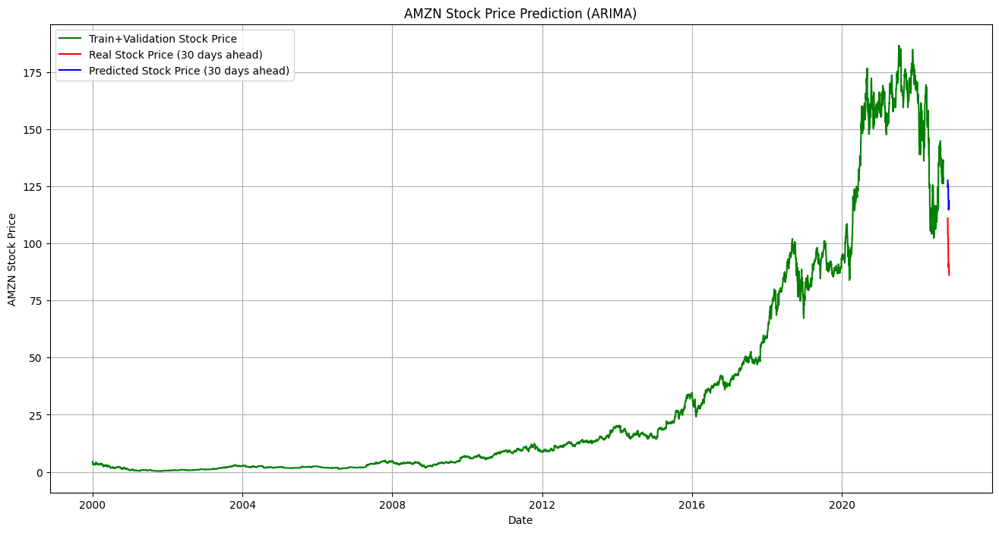

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,8))

# Plot train+validation history
plt.plot(train_validation.index, train_validation, color='green', label = 'Train+Validation Stock Price')

# Ensure we have enough data in 'test' for the 30-day ahead forecasts
# We are forecasting 30 days ahead. So the predictions[t] corresponds to test.iloc[t+29]
# The actual prices to compare against are test.iloc[29 : PERIODS_TO_PREDICT + 29]
start_idx_for_plot = 29
end_idx_for_plot = PERIODS_TO_PREDICT + 29

if end_idx_for_plot <= len(test):
    actual_forecast_dates = test.index[start_idx_for_plot : end_idx_for_plot]
    actual_forecast_values = test.iloc[start_idx_for_plot : end_idx_for_plot]

    # Plot actual test prices for the forecast horizon (30 days ahead)
    plt.plot(actual_forecast_dates, actual_forecast_values, color = 'red', label = 'Real Stock Price (30 days ahead)')

    # Plot predicted prices (30 days ahead)
    plt.plot(actual_forecast_dates, predictions, color = 'blue', label = 'Predicted Stock Price (30 days ahead)')
else:
    print(f"Not enough data in 'test' for {PERIODS_TO_PREDICT} 30-day ahead predictions to align for plotting.")
    print(f"'test' length: {len(test)}, required length for plotting {end_idx_for_plot}")

plt.title('AMZN Stock Price Prediction (ARIMA)')
plt.xlabel('Date')
plt.ylabel('AMZN Stock Price')
plt.legend()
plt.grid(True)
plt.show()

## 1.4) [Code Snippet 5] Binary Decision Tree

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

### 1.4.1) Define dataframes AND perform data cleaning
* define X_train (dataframe), X_test (dataframe), y_train (series), y_test (series)
* replace +-inf. with 0
* fill NaNs with 0 (you can drop it too, but will loose a lot of data in our case
* remove 1-2% outliers (in each dimension, or only in variable to_predict :: we won't use it for a Decision Tree

In [ ]:
# Decision Tree doesn't like too large and inf. values
import numpy as np

def remove_infinite_values(X):
    """
    Remove infinite values from the input array.

    Parameters:
    - X: Input array (NumPy array or array-like)

    Returns:
    - Array with infinite values removed
    """
    return X[np.isfinite(X).all(axis=1)]

# Example usage:
# Assuming X is your input data
# filtered_X = remove_infinite_values(X)

In [ ]:
# look carefully for 'count' to be close to total values (or you need to replace NaNs/remove NaNs), and min/max doesn't equal to -+inf.
#  it will give you an idea to dig deeper into some features to understand the 'nature' of a problem
pd.set_option('display.max_rows', None)

new_df[NUMERICAL+DUMMIES].describe().T

,count,mean,std,min,25%,50%,75%,max
growth_1d,202277.0,1.000825e+00,2.418083e-02,2.300551e-01,9.906975e-01,1.000448e+00,1.010598e+00,4.374775e+00
growth_3d,202247.0,1.002419e+00,3.950841e-02,2.425170e-01,9.841664e-01,1.002000e+00,1.019992e+00,4.446675e+00
growth_7d,202187.0,1.005547e+00,5.793361e-02,2.326554e-01,9.771211e-01,1.005036e+00,1.033039e+00,4.599881e+00
growth_30d,201842.0,1.023700e+00,1.160659e-01,2.461313e-01,9.611859e-01,1.020682e+00,1.082346e+00,5.179688e+00
growth_90d,200942.0,1.073406e+00,2.146786e-01,1.890117e-01,9.546445e-01,1.058288e+00,1.171195e+00,5.970047e+00
growth_365d,196532.0,1.344875e+00,6.061920e-01,9.783037e-02,1.012544e+00,1.237688e+00,1.524308e+00,9.819908e+00
growth_dax_1d,198978.0,1.000282e+00,1.385765e-02,8.776139e-01,9.939737e-01,1.000718e+00,1.007083e+00,1.114020e+00
growth_dax_3d,198978.0,1.000900e+00,2.359598e-02,8.374862e-01,9.895442e-01,1.002065e+00,1.013663e+00,1.144124e+00
growth_dax_7d,198978.0,1.002217e+00,3.506705e-02,7.318924e-01,9.851298e-01,1.004732e+00,1.021454e+00,1.232460e+00
growth_dax_30d,198978.0,1.009657e+00,6.979685e-02,6.263172e-01,9.756793e-01,1.015180e+00,1.049860e+00,1.288371e+00


In [ ]:
# Split the data into training and testing sets based on the split date
features_list = NUMERICAL+DUMMIES
to_predict = 'is_positive_growth_30d_future'

train_df = new_df[new_df.split.isin(['train','validation'])].copy(deep=True)
test_df = new_df[new_df.split.isin(['test'])].copy(deep=True)

# ONLY numerical Separate features and target variable for training and testing sets
# need Date and Ticker later when merging predictions to the dataset
X_train = train_df[features_list+[to_predict,'Date','Ticker']]
X_test = test_df[features_list+[to_predict,'Date','Ticker']]

print(f'length: X_train {X_train.shape},  X_test {X_test.shape}')


length: X_train (169129, 242),  X_test (33163, 242)


In [ ]:
# Can't have +-inf values . E.g. ln(volume)=-inf when volume==0 => substitute with 0

# Disable SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # default='warn'

X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# Need to fill NaNs somehow
X_train.fillna(0, inplace=True)
X_test.fillna(0, inplace=True)

print(f'length: X_train_imputed {X_train.shape},  X_test_imputed {X_test.shape}')

length: X_train_imputed (169129, 242),  X_test_imputed (33163, 242)


In [ ]:
# you may want to remove 1-2% outliers based on percentile ==> not used here in Decision Trees
def remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99):
    """
    Remove outliers from the input array based on percentiles.

    Parameters:
    - X: Input array (NumPy array or array-like)
    - lower_percentile: Lower percentile threshold (float, default=1)
    - upper_percentile: Upper percentile threshold (float, default=99)

    Returns:
    - Array with outliers removed
    """
    lower_bound = np.percentile(X, lower_percentile, axis=0)
    upper_bound = np.percentile(X, upper_percentile, axis=0)
    mask = np.logical_and(np.all(X >= lower_bound, axis=1), np.all(X <= upper_bound, axis=1))
    return X[mask]

# Example usage:
# Assuming X is your input data
# filtered_X = remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99)

In [ ]:
X_train_imputed = X_train # we won't use outliers removal to save more data to train: remove_outliers_percentile(X_train)
X_test_imputed = X_test # we won't use outliers removal to save more data to test: remove_outliers_percentile(X_test)

In [ ]:
# same shape
print(f'length: X_train_imputed {X_train_imputed.shape},  X_test_imputed {X_test_imputed.shape}')

length: X_train_imputed (169129, 242),  X_test_imputed (33163, 242)


In [ ]:
y_train = X_train_imputed[to_predict]
y_test = X_test_imputed[to_predict]

# remove y_train, y_test from X_ dataframes
del X_train_imputed[to_predict]
del X_test_imputed[to_predict]

### 1.4.2 Estimation of a Decision Tree model

In [ ]:
# INPUTS:
# X_train_imputed : CLEAN dataFrame with only numerical features (train+validation periods)
# X_test_imputed : CLEAN dataFrame with only numerical features (test periods)

# y_train : true values for the train period
# y_test  : true values for the test period

In [ ]:
# estimation/fit function (using dataframe of features X and what to predict y) --> optimising total accuracy
# max_depth is hyperParameter
def fit_decision_tree(X, y, max_depth=20):
# Initialize the Decision Tree Classifier
  clf = DecisionTreeClassifier(max_depth=max_depth)

  # Fit the classifier to the training data
  clf.fit(X, y)
  return clf, X.columns

In [ ]:
%%time
# drop 2 columns before fitting the tree, but we need those columns later for joins
clf_20, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=20)

CPU times: user 51.2 s, sys: 154 ms, total: 51.4 s
Wall time: 51.7 s


In [ ]:
%%time
clf_10, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=10)

CPU times: user 31.1 s, sys: 130 ms, total: 31.2 s
Wall time: 31.4 s


In [ ]:
# TODO 3: TRAIN only on train dataset, experiment with trees with depth 1..20 --> find the best one on VALID dataset
#       for the "best" tree model: find precision on the TEST set

### 1.4.3 Inference for a Decision Tree

In [ ]:
def predict_decision_tree(clf:DecisionTreeClassifier, df_X:pd.DataFrame, y_true: pd.Series):
  # Predict the target variable on the test data
  y_pred = clf.predict(df_X)

  max_depth = clf.tree_.max_depth
  # Print the maximum depth
  print("Maximum depth of the decision tree:", max_depth)

  # Calculate the accuracy/precision of the model
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  print(f'Accuracy ={accuracy}, precision = {precision}')

  # resulting df
  result_df = pd.concat([df_X, y_true, pd.Series(y_pred, index=df_X.index, name='pred_')], axis=1)

  return result_df

In [ ]:
pred20 = predict_decision_tree(clf_20, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

Maximum depth of the decision tree: 20
Accuracy =0.4874408226035039, precision = 0.5942315290399052


In [ ]:
# Predictions of a decision tree of depth "20"
pred20.pred_.value_counts()

,count
pred_,
0,23039
1,10124


In [ ]:
pred10 = predict_decision_tree(clf_10, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

Maximum depth of the decision tree: 10
Accuracy =0.48614419684588245, precision = 0.5985625198182011


In [ ]:
pred10.tail()

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,is_positive_growth_30d_future,pred_
6014,1.000000,1.002065,0.988855,0.976571,1.007333,1.144080,0.995004,0.994697,0.978368,0.978443,...,0,0,0,0,0,0,1,0,0,0
6015,0.979647,0.973628,0.971393,0.965088,1.008249,1.123779,0.998485,1.001622,0.975270,0.969466,...,0,0,0,0,0,0,1,0,0,0
6016,0.988833,0.968708,0.952163,0.938551,0.981892,1.129175,1.005333,0.998795,0.981975,0.977473,...,0,0,0,0,0,0,1,0,0,0
6017,1.007485,0.975958,0.972150,0.944458,0.983065,1.143249,1.007008,1.010845,0.988814,0.983802,...,0,0,0,0,0,0,1,0,0,0
6018,1.012721,1.008907,0.990414,0.957840,1.003568,1.157707,0.983954,0.996133,0.989350,0.961421,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
import numpy as np
import pandas as pd

# Use globally defined NUMERICAL, DUMMIES, and TO_PREDICT
# These should have been defined in earlier cells (e.g., nakB0XZA1uFq, sxLHnVE3RaaU, G7kZrwZiIpCN).
global_NUMERICAL = globals().get('NUMERICAL', [])
global_DUMMIES = globals().get('DUMMIES', [])
global_TO_PREDICT = globals().get('TO_PREDICT', [])

features_list_from_globals = global_NUMERICAL + global_DUMMIES
to_predict_col = global_TO_PREDICT[1] if len(global_TO_PREDICT) > 1 else 'is_positive_growth_30d_future' # Fallback

# Ensure new_df is available and properly structured
if 'new_df' not in globals() or globals()['new_df'].empty:
    raise RuntimeError("new_df is not defined or is empty. Please run all preceding data loading and preprocessing cells.")

test_df = new_df[new_df.split.isin(['test'])].copy(deep=True)

# Filter features_list_from_globals to include only columns actually present in test_df
valid_features = [col for col in features_list_from_globals if col in test_df.columns]

# Construct the final list of columns for X_test
X_test_columns_to_select = valid_features + ['Date', 'Ticker']
if to_predict_col in test_df.columns and to_predict_col not in X_test_columns_to_select:
    X_test_columns_to_select.append(to_predict_col)

# Re-create X_test with all necessary columns using the filtered list
X_test = test_df[X_test_columns_to_select].copy() # .copy() to ensure it's not a view

# Handle inf and NaN values (as done in cell 46GYMy7KRUB3)
pd.options.mode.chained_assignment = None # Disable SettingWithCopyWarning temporarily
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.fillna(0, inplace=True)
pd.options.mode.chained_assignment = 'warn' # Re-enable the warning

# Assign to X_test_imputed (as done in cell 8-NNrhAKWXr8)
X_test_imputed = X_test.copy() # Make a copy to prevent further SettingWithCopyWarning

# Delete to_predict column from X_test_imputed (as done in cell E6A_zhDLW0aC)
if to_predict_col in X_test_imputed.columns:
    del X_test_imputed[to_predict_col]

print(f'X_test_imputed has been recreated with shape: {X_test_imputed.shape}')

X_test_imputed has been recreated with shape: (33163, 241)


In [ ]:
X_test_imputed.join(pred10['pred_']).head()

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,Date,Ticker,pred_
9203,0.997392,0.971229,0.948274,0.864655,0.929136,0.991729,0.983375,0.966056,0.986473,0.938657,...,0,0,0,0,0,0,1,2022-09-16,MSFT,0
9204,0.999101,0.969471,0.945846,0.866138,0.911353,0.977731,1.004865,0.982748,0.992167,0.935384,...,0,0,0,0,0,0,1,2022-09-19,MSFT,1
9205,0.991534,0.988059,0.916774,0.866740,0.934679,0.959602,0.989658,0.977940,0.968110,0.936155,...,0,0,0,0,0,0,1,2022-09-20,MSFT,1
9206,0.985564,0.976342,0.896118,0.848237,0.939945,0.945527,1.007602,1.002032,0.952611,0.931846,...,0,0,0,0,0,0,1,2022-09-21,MSFT,0
9207,1.008496,0.985523,0.956308,0.835148,0.926984,0.944042,0.981553,0.978786,0.950161,0.915084,...,0,0,0,0,0,0,1,2022-09-22,MSFT,1


In [ ]:
# Merge Decision Tree predictions with the main DataFrame
# Use 'Date' and 'Ticker' as merge keys as they are present in both `new_df` and `pred_df`s

# pred10 and pred20 dataframes were created using X_test_imputed.drop(['Date','Ticker'],axis=1)
# so they do NOT contain 'Date' and 'Ticker' directly.
# We need to re-add 'Date' and 'Ticker' from X_test_imputed based on their index.

# Get Date and Ticker from X_test_imputed, preserving the original index
date_ticker_info = X_test_imputed[['Date', 'Ticker']]

# Ensure pred10 and pred20 have 'Date' and 'Ticker' for merging
# Since pred10 and pred20 are created with df_X and y_true, they share the index of X_test_imputed
pred10_with_date_ticker = pred10.join(date_ticker_info)
pred20_with_date_ticker = pred20.join(date_ticker_info)

# Now, create pred10_df and pred20_df from these new DataFrames
pred10_df = pred10_with_date_ticker[['Date', 'Ticker']].copy()
pred10_df['pred_tree_clf10'] = pred10_with_date_ticker['pred_'].values

pred20_df = pred20_with_date_ticker[['Date', 'Ticker']].copy()
pred20_df['pred_tree_clf20'] = pred20_with_date_ticker['pred_'].values

# Make sure the 'split' column in new_df is used for filtering only the 'test' set for merging
# We need to make sure new_df is not modified before extracting the test subset
new_df_test_subset = new_df[new_df['split'] == 'test'].copy()

# Merge pred10_df
merged_df = pd.merge(new_df_test_subset, pred10_df[['Date', 'Ticker', 'pred_tree_clf10']],
                     on=['Date', 'Ticker'], how='left')

# Merge pred20_df
merged_df = pd.merge(merged_df, pred20_df[['Date', 'Ticker', 'pred_tree_clf20']],
                     on=['Date', 'Ticker'], how='left')

# Update the original new_df for the test split
# Ensure Date and Ticker are proper types for indexing/merging if needed
# Temporarily set index for efficient updating
# Use .copy() to avoid SettingWithCopyWarning
new_df_copy = new_df.copy()
new_df_indexed = new_df_copy.set_index(['Date', 'Ticker'], drop=False)
merged_df_indexed = merged_df.set_index(['Date', 'Ticker'], drop=False)

# Update only the 'test' split rows in new_df
# Use .loc with a list of columns for setting multiple columns
new_df_indexed.loc[merged_df_indexed.index, ['pred_tree_clf10', 'pred_tree_clf20']] = \
    merged_df_indexed[['pred_tree_clf10', 'pred_tree_clf20']]

# Since index keys were kept as columns (drop=False), we drop them from the index during reset to prevent duplication
new_df = new_df_indexed.reset_index(drop=True)

print("Decision tree predictions merged into new_df.")
print(new_df[['Date', 'Ticker', 'pred_tree_clf10', 'pred_tree_clf20']].tail())

Decision tree predictions merged into new_df.
             Date Ticker  pred_tree_clf10  pred_tree_clf20
202287 2026-09-14  LT.NS              0.0              0.0
202288 2026-09-15  LT.NS              0.0              0.0
202289 2026-09-16  LT.NS              0.0              0.0
202290 2026-09-17  LT.NS              0.0              0.0
202291 2026-09-18  LT.NS              0.0              0.0


In [ ]:
# Predictions of a decision tree of depth "10" : many more "positive" predictions
pred10.pred_.value_counts()

,count
pred_,
0,23702
1,9461


In [ ]:
import numpy as np
import pandas as pd

# Reconstruct X_test_imputed if it's not available in the global scope
if 'X_test_imputed' not in globals():
    print("X_test_imputed not found, reconstructing for robustness...")
    # Assuming NUMERICAL, DUMMIES, and TO_PREDICT are defined in previous cells
    features_list = globals().get('NUMERICAL', []) + globals().get('DUMMIES', [])
    to_predict_col = globals().get('TO_PREDICT', ['', 'is_positive_growth_30d_future'])[1]

    # Ensure new_df is available and properly structured
    if 'new_df' not in globals() or globals()['new_df'].empty:
        raise RuntimeError("new_df is not defined or is empty. Please run all preceding data loading and preprocessing cells.")

    temp_test_df = globals()['new_df'][globals()['new_df'].split.isin(['test'])].copy(deep=True)
    temp_X_test = temp_test_df[features_list + [to_predict_col, 'Date', 'Ticker']].copy()

    pd.options.mode.chained_assignment = None # Disable SettingWithCopyWarning
    temp_X_test.replace([np.inf, -np.inf], np.nan, inplace=True)
    temp_X_test.fillna(0, inplace=True)
    pd.options.mode.chained_assignment = 'warn' # Re-enable

    X_test_imputed = temp_X_test.copy()
    if to_predict_col in X_test_imputed.columns:
        del X_test_imputed[to_predict_col]
    print(f"X_test_imputed reconstructed with shape: {X_test_imputed.shape}")
else:
    print("X_test_imputed is already available.")

# define a new DF with the SAME index (used for joins)
pred20_df = X_test_imputed[['Date', 'Ticker']].copy()
pred20_df['pred_tree_clf20'] = pred20['pred_'].values
pred20_df.head(1)

X_test_imputed is already available.


,Date,Ticker,pred_tree_clf20
9203,2022-09-16,MSFT,0


In [ ]:
import numpy as np
import pandas as pd

# Reconstruct X_test_imputed if it's not available in the global scope
# This provides redundancy for robustness if cells are run out of order, though _pgIZ95bmLD3 should define it.
if 'X_test_imputed' not in globals():
    print("X_test_imputed not found, reconstructing for robustness...")
    features_list = globals().get('NUMERICAL', []) + globals().get('DUMMIES', [])
    to_predict_col = globals().get('TO_PREDICT', ['', 'is_positive_growth_30d_future'])[1]

    if 'new_df' not in globals() or globals()['new_df'].empty:
        raise RuntimeError("new_df is not defined or is empty. Please run all preceding data loading and preprocessing cells.")

    temp_test_df = globals()['new_df'][globals()['new_df'].split.isin(['test'])].copy(deep=True)
    temp_X_test = temp_test_df[features_list + [to_predict_col, 'Date', 'Ticker']].copy()

    pd.options.mode.chained_assignment = None
    temp_X_test.replace([np.inf, -np.inf], np.nan, inplace=True)
    temp_X_test.fillna(0, inplace=True)
    pd.options.mode.chained_assignment = 'warn'

    X_test_imputed = temp_X_test.copy()
    if to_predict_col in X_test_imputed.columns:
        del X_test_imputed[to_predict_col]
    print(f"X_test_imputed reconstructed with shape: {X_test_imputed.shape}")
else:
    print("X_test_imputed is already available.")

# define a new DF with the SAME index (used for joins)
pred10_df = X_test_imputed[['Date', 'Ticker']].copy()
pred10_df['pred_tree_clf10'] = pred10['pred_'].values
pred10_df.head(1)

X_test_imputed is already available.


,Date,Ticker,pred_tree_clf10
9203,2022-09-16,MSFT,0


### 1.4.4 Features Importance and Tree Visualisation of top levels (for clf10)

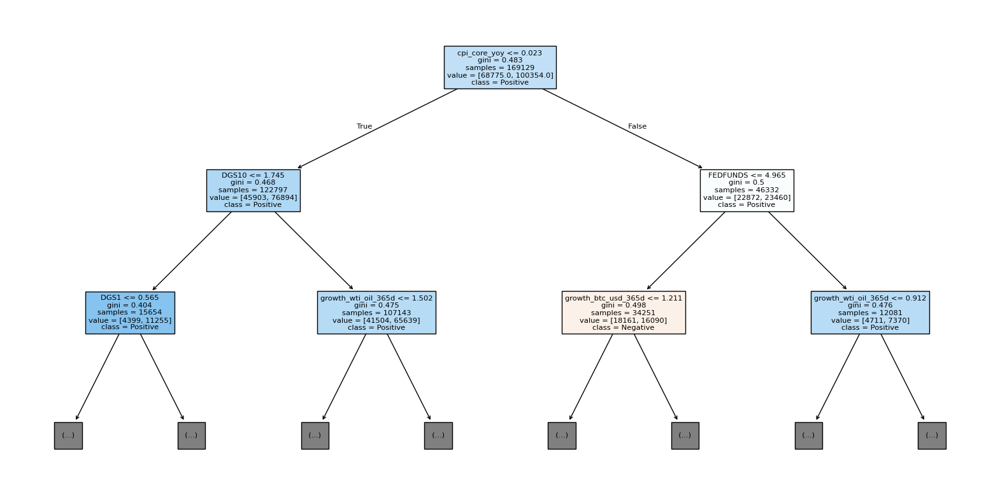

In [ ]:
# visualisation: decision tree for a few levels (max_depth variable)
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming clf is your trained DecisionTreeClassifier
plt.figure(figsize=(20,10))  # Set the size of the figure
plot_tree(clf_10,
          filled=True,
          feature_names=train_columns,
          class_names=['Negative', 'Positive'],
          max_depth=2)
plt.show()

In [ ]:
# Feautures importance function to predict future returns (based on the classifier)
# get feature importance from 'clf' (classifier) and 'train_columns' (column names)

def get_importances(clf, train_columns):
  # Assuming clf is your trained DecisionTreeClassifier
  feature_importance = clf.feature_importances_

  # Assuming X_train is your training features
  feature_names = train_columns

  # Create a DataFrame to store feature importance
  feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

  # Sort the DataFrame by importance in descending order
  feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

  # Print or display the feature importance DataFrame
  # print(feature_importance_df)
  return feature_importance_df

In [ ]:
get_importances(clf_10, train_columns).head(10)

,Feature,Importance
178,cpi_core_yoy,0.066433
35,growth_gold_365d,0.052547
179,cpi_core_mom,0.046523
41,growth_wti_oil_365d,0.037512
180,FEDFUNDS,0.036529
93,ad,0.036205
95,obv,0.034833
53,growth_btc_usd_365d,0.030654
90,trix,0.029316
22,growth_dji_90d,0.028911


In [ ]:
get_importances(clf_20, train_columns).head(10)

,Feature,Importance
95,obv,0.043788
93,ad,0.042752
90,trix,0.033972
5,growth_365d,0.031647
174,volatility,0.026064
178,cpi_core_yoy,0.024528
97,natr,0.023021
35,growth_gold_365d,0.020880
4,growth_90d,0.020469
55,adxr,0.019320


### 1.4.5 Merge with the original df for predictions (only when predicted on test dataset)

In [ ]:
# current predictions from MANUAL
PREDICTIONS

['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp']

In [ ]:
new_df.head()

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,ticker_type_US,split,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_correct_pred0,is_correct_pred1,is_correct_pred2,pred_tree_clf10,pred_tree_clf20
0,35.623602,36.002980,33.992277,35.377007,53228400.0,0.0,0.0,MSFT,2000,1,...,1,train,0,1,1,1,0,0,NaN,NaN
1,34.466525,35.547754,34.068178,34.181992,54119000.0,0.0,0.0,MSFT,2000,1,...,1,train,0,1,0,1,0,1,NaN,NaN
2,33.726722,35.320110,33.195592,34.542385,64059600.0,0.0,0.0,MSFT,2000,1,...,1,train,0,1,0,1,0,1,NaN,NaN
3,34.049185,34.561345,32.892081,33.385273,54976600.0,0.0,0.0,MSFT,2000,1,...,1,train,0,1,0,1,0,1,NaN,NaN
4,32.967948,34.068144,32.569601,33.821548,62013600.0,0.0,0.0,MSFT,2000,1,...,1,train,0,1,1,1,0,0,NaN,NaN


In [ ]:
# index in df is not unique
np.sort(new_df.groupby(new_df.index).split.count())

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
# it's hard to join with pred10_df - as index is totally different
pred10_df.head()

,Date,Ticker,pred_tree_clf10
9203,2022-09-16,MSFT,0
9204,2022-09-19,MSFT,1
9205,2022-09-20,MSFT,1
9206,2022-09-21,MSFT,0
9207,2022-09-22,MSFT,1


In [ ]:
# TODO 4: JOIN predictions with the original dataframe (define a new column):
#  so, that there are columns pred_tree_clf10 AND pred_tree_clf20